In [1]:
# Import our dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

from google.colab import files

!pip install dtreeviz
from dtreeviz.trees import dtreeviz # will be used for tree visualization
from sklearn import tree

Load in dataset

In [2]:
data_df = pd.read_csv("https://raw.githubusercontent.com/joshuanallen/Air_Quality_Prediction/main/datasets/clean_data.csv")
data_df.head()

,Unnamed: 0,Census Tract,Total Population,ZIP,Longitude,Latitude,Ozone,PM2.5,Diesel PM,Pesticides,Tox. Release,Traffic,Asthma,Low Birth Weight,Cardiovascular Disease,Poverty,Unemployment
0,0,6019001100,3174,93706,-119.781696,36.709695,0.065,15.40,48.524,2.75,18551.957190,909.14,131.64,7.44,14.13,76.3,17.6
1,1,6071001600,6133,91761,-117.618013,34.057780,0.062,13.31,38.556,1.37,7494.236622,782.26,60.66,7.04,12.94,72.5,12.3
2,2,6019000200,3167,93706,-119.805504,36.735491,0.062,15.40,47.445,3.03,12454.948410,576.52,142.12,10.16,14.96,86.8,16.1
3,3,6077000801,6692,95203,-121.314524,37.940517,0.046,12.54,24.117,12.93,2387.782922,1305.01,142.17,6.23,14.72,61.3,19.6
4,4,6019001500,2206,93725,-119.717843,36.681600,0.065,15.40,18.846,3518.41,21790.706720,435.16,90.48,4.50,12.82,66.4,18.6


Drop unnecessary columns

In [3]:
drop_loc_data_df = data_df[["Ozone", "PM2.5", "Diesel PM", "Pesticides", "Tox. Release", "Traffic", "Asthma", "Low Birth Weight", "Cardiovascular Disease", "Poverty", "Unemployment"]]
drop_loc_data_df.head()

,Ozone,PM2.5,Diesel PM,Pesticides,Tox. Release,Traffic,Asthma,Low Birth Weight,Cardiovascular Disease,Poverty,Unemployment
0,0.065,15.40,48.524,2.75,18551.957190,909.14,131.64,7.44,14.13,76.3,17.6
1,0.062,13.31,38.556,1.37,7494.236622,782.26,60.66,7.04,12.94,72.5,12.3
2,0.062,15.40,47.445,3.03,12454.948410,576.52,142.12,10.16,14.96,86.8,16.1
3,0.046,12.54,24.117,12.93,2387.782922,1305.01,142.17,6.23,14.72,61.3,19.6
4,0.065,15.40,18.846,3518.41,21790.706720,435.16,90.48,4.50,12.82,66.4,18.6


Identify any missing data

In [4]:
print(drop_loc_data_df.isnull().sum())

Ozone                     0
PM2.5                     0
Diesel PM                 0
Pesticides                0
Tox. Release              0
Traffic                   0
Asthma                    0
Low Birth Weight          0
Cardiovascular Disease    0
Poverty                   0
Unemployment              0
dtype: int64


Describe data



In [5]:
drop_loc_data_df.describe()

,Ozone,PM2.5,Diesel PM,Pesticides,Tox. Release,Traffic,Asthma,Low Birth Weight,Cardiovascular Disease,Poverty,Unemployment
count,7712.000000,7712.000000,7712.000000,7712.000000,7712.000000,7712.000000,7712.000000,7712.000000,7712.000000,7712.000000,7712.000000
mean,0.047426,10.420606,19.348765,320.518047,3204.873215,953.325455,52.503613,4.980663,8.320344,36.412202,10.182923
std,0.010220,2.568878,16.469596,2822.298975,12652.368968,913.593370,30.330867,1.550364,2.929641,20.251424,4.957414
min,0.026000,1.869001,0.021000,0.000000,0.000000,22.410000,3.630000,0.000000,1.560000,1.000000,0.000000
25%,0.040000,8.697944,9.172000,0.000000,103.800931,450.047500,30.420000,3.960000,6.140000,19.200000,6.600000
50%,0.046000,10.370000,16.725500,0.000000,489.912078,706.890000,45.900000,4.920000,8.005000,33.600000,9.300000
75%,0.055000,12.050000,24.740750,0.360000,3571.025854,1207.335000,66.430000,5.930000,10.080000,51.600000,12.800000
max,0.068000,19.600000,208.400000,91316.190000,842751.329300,45687.870000,223.300000,14.890000,21.260000,94.900000,60.500000


Split dataset into feature and target variable datasets

Features:
1. Ozone
2. PM2.5
3. Diesel PM
4. Pesticides
5. Tox. Release
6. Traffic

We chose 5 target variables to build predictive models

Targets:
1. Asthma
2. Low Birth Weight
3. Cardiovascular Disease
4. Poverty
5. Unemployment


In [6]:
# Features
X_air_data = drop_loc_data_df[["Ozone", "PM2.5", "Diesel PM", "Pesticides", "Tox. Release", "Traffic"]]

# Targets
y_Asthma = drop_loc_data_df["Asthma"]
y_Low_birth_weight = drop_loc_data_df["Low Birth Weight"]
y_Cardiovascular_disease = drop_loc_data_df["Cardiovascular Disease"]
y_Poverty = drop_loc_data_df["Poverty"]
y_Unemployment = drop_loc_data_df["Unemployment"]

Standardize feature variables

1. Split into training and test datasets
2. Scale the `X_train` and `X_test` dataset

**Asthma** Random forest Regressor model

In [7]:
X = X_air_data
y = y_Asthma

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

In [8]:
# Create a StandardScaler instance
scaler = StandardScaler()
# scaler = MinMaxScaler()
# scaler = RobustScaler()


# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

Random forest predictive r-square: 0.602
Random forest predictive adjusted r-square: 0.601
Feature: 0, Score: 0.16162
Feature: 1, Score: 0.15039
Feature: 2, Score: 0.22024
Feature: 3, Score: 0.04800
Feature: 4, Score: 0.30327
Feature: 5, Score: 0.11648


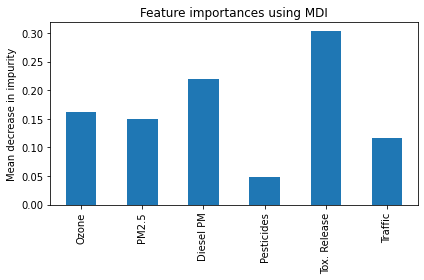

In [9]:
# Create a random forest regressor.

rf_model = RandomForestRegressor(n_estimators=128, random_state=78)

# Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = rf_model.predict(X_test_scaled)
print(f"Random forest predictive r-square: {rf_model.score(X_test_scaled,y_test):.3f}")

# adjusted R-squared
adj_r2 = 1 - ( 1-rf_model.score(X_test_scaled, y_test) ) * ( len(y_test) - 1 ) / ( len(y_test) - X_test_scaled.shape[1] - 1 )
print(f"Random forest predictive adjusted r-square: {adj_r2:.3f}")

# get importance
importance = rf_model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

feature_names = list(X.columns.values)
forest_importances = pd.Series(importance, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

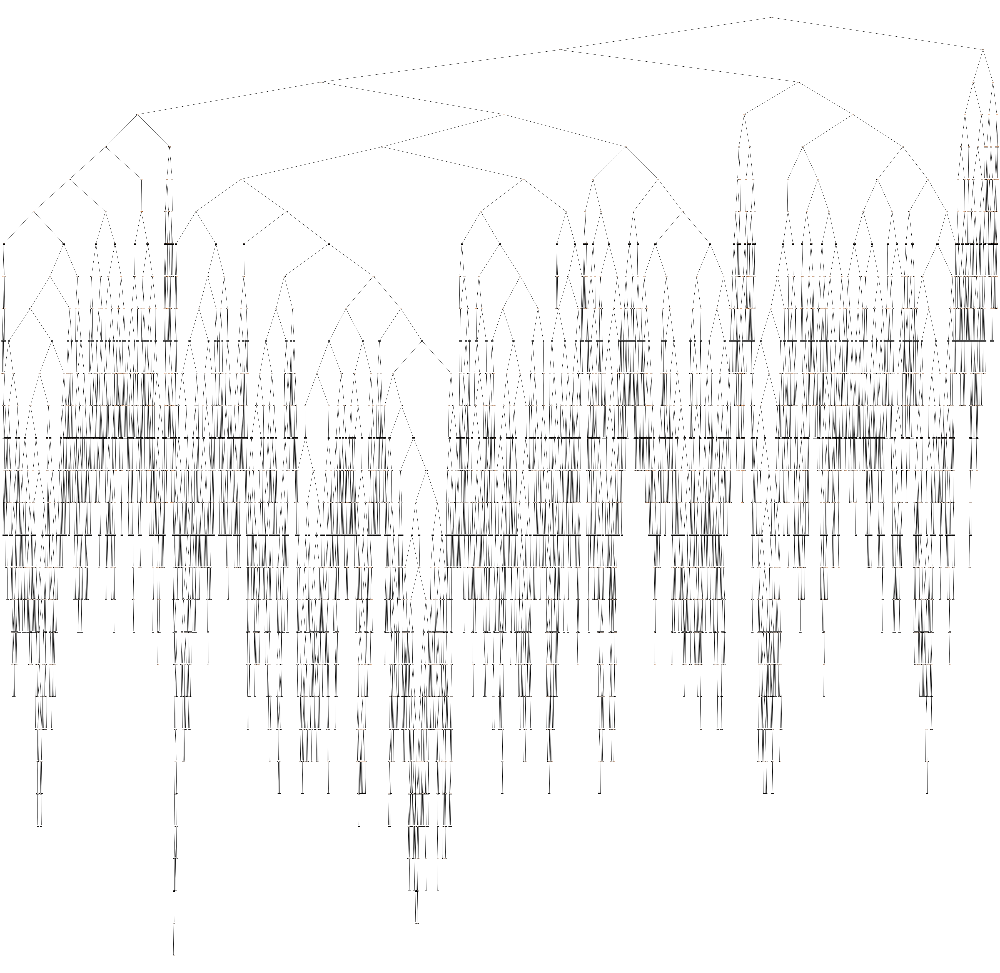

In [10]:
#https://stackoverflow.com/questions/56683489/use-dtreeviz-to-visualize-decision-tree

plt.figure(figsize=(100,100))
_ = tree.plot_tree(rf_model.estimators_[0], feature_names=X.columns, filled=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

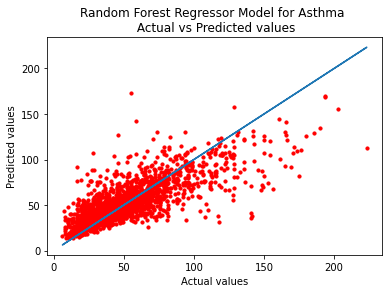

In [11]:
plt.figure()
plt.plot(y_test, y_test)
plt.scatter(y_test, y_pred, s=10, c="red")
plt.title("Random Forest Regressor Model for Asthma \n Actual vs Predicted values")
plt.xlabel("Actual values")
plt.ylabel("Predicted values")

plt.savefig("rfr_asthma_prediction_plot.png", format="png")
files.download('rfr_asthma_prediction_plot.png')

**Low Birth Rate** Random Forest Regressor Model

In [12]:
X = X_air_data
y = y_Low_birth_weight

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

In [13]:
# Create a StandardScaler instance
scaler = StandardScaler()
# scaler = MinMaxScaler()
# scaler = RobustScaler()


# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

Random forest predictive r-square: 0.115
Random forest predictive adjusted r-square: 0.112
Feature: 0, Score: 0.10005
Feature: 1, Score: 0.08919
Feature: 2, Score: 0.26262
Feature: 3, Score: 0.06422
Feature: 4, Score: 0.25930
Feature: 5, Score: 0.22463


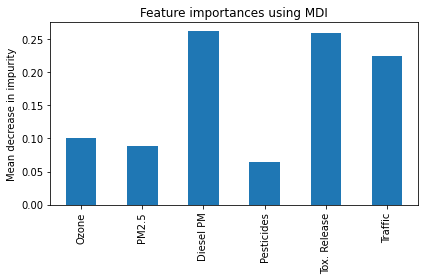

In [14]:
# Create a random forest regressor.

rf_model = RandomForestRegressor(n_estimators=128, random_state=78)

# Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = rf_model.predict(X_test_scaled)
print(f"Random forest predictive r-square: {rf_model.score(X_test_scaled,y_test):.3f}")

# adjusted R-squared
adj_r2 = 1 - ( 1-rf_model.score(X_test_scaled, y_test) ) * ( len(y_test) - 1 ) / ( len(y_test) - X_test_scaled.shape[1] - 1 )
print(f"Random forest predictive adjusted r-square: {adj_r2:.3f}")

# get importance
importance = rf_model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

feature_names = list(X.columns.values)
forest_importances = pd.Series(importance, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

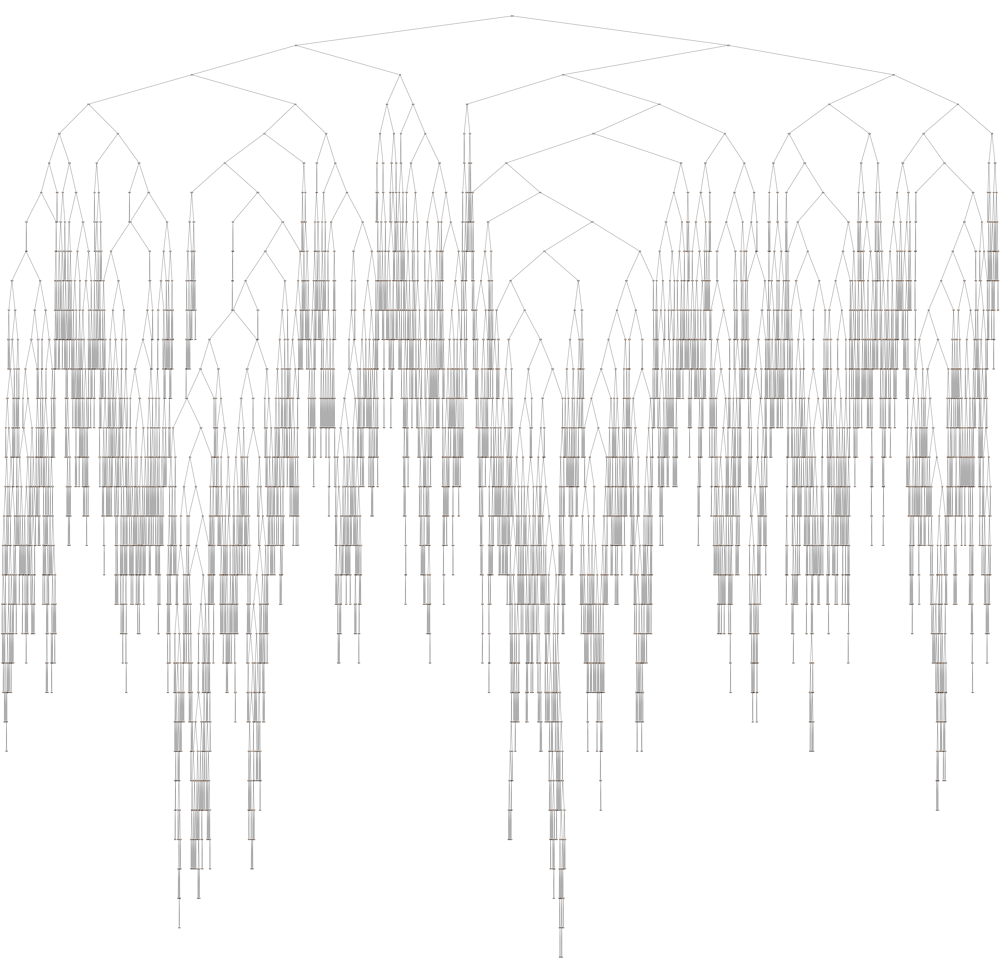

In [15]:
plt.figure(figsize=(100,100))
_ = tree.plot_tree(rf_model.estimators_[0], feature_names=X.columns, filled=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

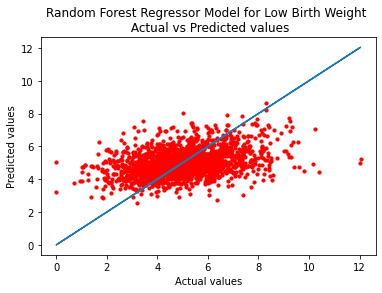

In [16]:
plt.figure()
plt.plot(y_test, y_test)
plt.scatter(y_test, y_pred, s=10, c="red")
plt.title("Random Forest Regressor Model for Low Birth Weight \n Actual vs Predicted values")
plt.xlabel("Actual values")
plt.ylabel("Predicted values")

plt.savefig("rfr_lbw_prediction_plot.png", format="png")
files.download('rfr_lbw_prediction_plot.png')

**Cardiovascular Disease** Random Forest Regressor model

Random forest predictive r-square: 0.561
Random forest predictive adjusted r-square: 0.559
Feature: 0, Score: 0.24931
Feature: 1, Score: 0.15316
Feature: 2, Score: 0.16840
Feature: 3, Score: 0.05455
Feature: 4, Score: 0.25751
Feature: 5, Score: 0.11707


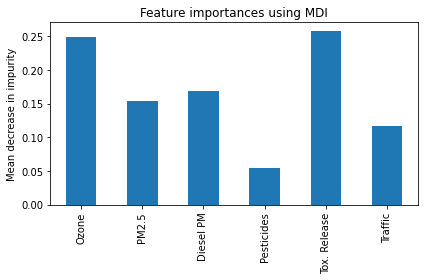

In [17]:
X = X_air_data
y = y_Cardiovascular_disease

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

# Create a StandardScaler instance
scaler = StandardScaler()
# scaler = MinMaxScaler()
# scaler = RobustScaler()


# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Create a random forest regressor.
rf_model = RandomForestRegressor(n_estimators=128, random_state=78)

# Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = rf_model.predict(X_test_scaled)
print(f"Random forest predictive r-square: {rf_model.score(X_test_scaled,y_test):.3f}")

# adjusted R-squared
adj_r2 = 1 - ( 1-rf_model.score(X_test_scaled, y_test) ) * ( len(y_test) - 1 ) / ( len(y_test) - X_test_scaled.shape[1] - 1 )
print(f"Random forest predictive adjusted r-square: {adj_r2:.3f}")

# get importance
importance = rf_model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
feature_names = list(X.columns.values)
forest_importances = pd.Series(importance, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

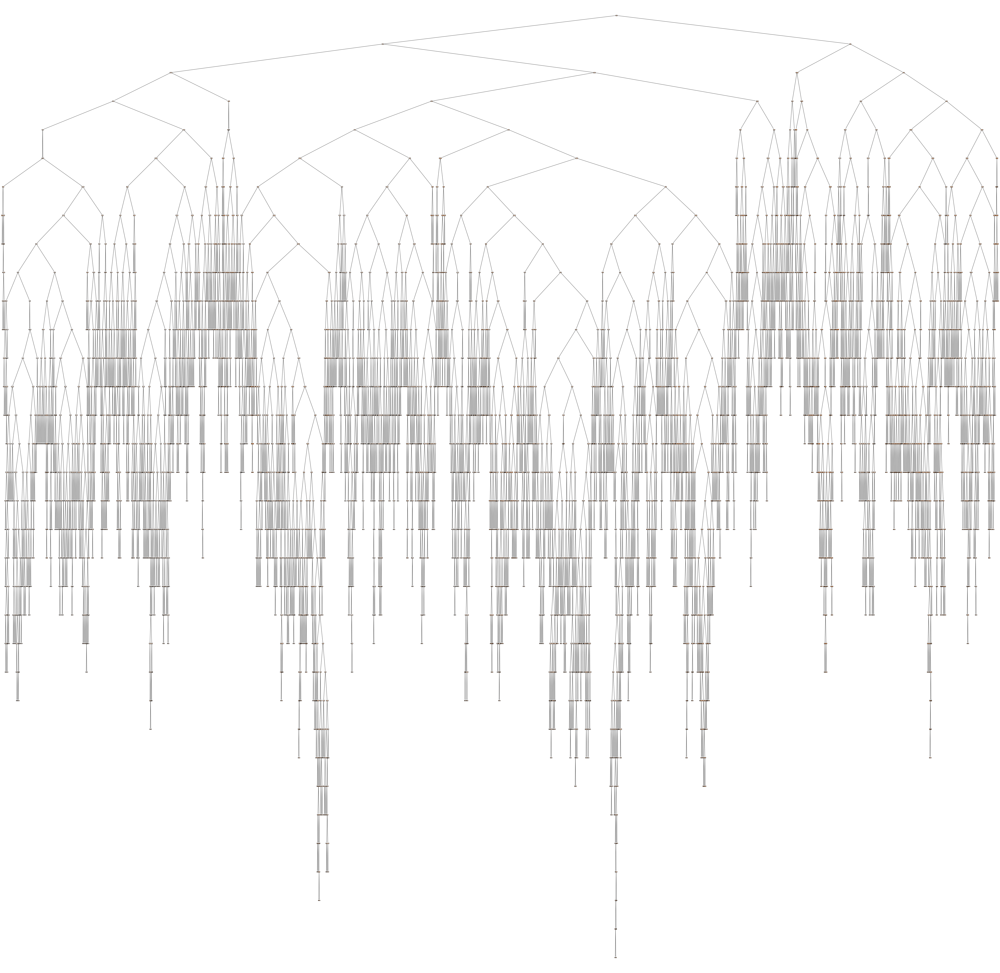

In [18]:
plt.figure(figsize=(100,100))
_ = tree.plot_tree(rf_model.estimators_[0], feature_names=X.columns, filled=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

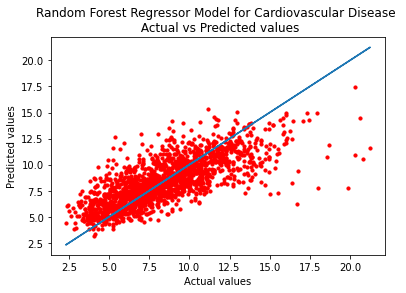

In [19]:
plt.figure()
plt.plot(y_test, y_test)
plt.scatter(y_test, y_pred, s=10, c="red")
plt.title("Random Forest Regressor Model for Cardiovascular Disease \n Actual vs Predicted values")
plt.xlabel("Actual values")
plt.ylabel("Predicted values")

plt.savefig("rfr_cvd_prediction_plot.png", format="png")
files.download('rfr_cvd_prediction_plot.png')

**Poverty** Random Forest Regressor model


Random forest predictive r-square: 0.500
Random forest predictive adjusted r-square: 0.498
Feature: 0, Score: 0.11069
Feature: 1, Score: 0.19091
Feature: 2, Score: 0.23803
Feature: 3, Score: 0.05517
Feature: 4, Score: 0.25617
Feature: 5, Score: 0.14903


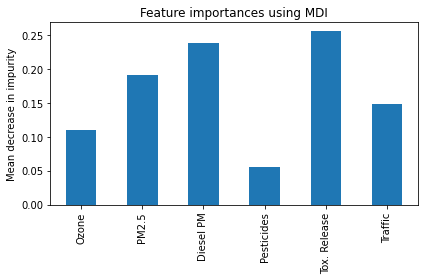

In [20]:
X = X_air_data
y = y_Poverty

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

# Create a StandardScaler instance
scaler = StandardScaler()
# scaler = MinMaxScaler()
# scaler = RobustScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Create a random forest regressor.
rf_model = RandomForestRegressor(n_estimators=128, random_state=78)

# Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = rf_model.predict(X_test_scaled)
print(f"Random forest predictive r-square: {rf_model.score(X_test_scaled,y_test):.3f}")

# adjusted R-squared
adj_r2 = 1 - ( 1-rf_model.score(X_test_scaled, y_test) ) * ( len(y_test) - 1 ) / ( len(y_test) - X_test_scaled.shape[1] - 1 )
print(f"Random forest predictive adjusted r-square: {adj_r2:.3f}")

# get importance
importance = rf_model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
feature_names = list(X.columns.values)
forest_importances = pd.Series(importance, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

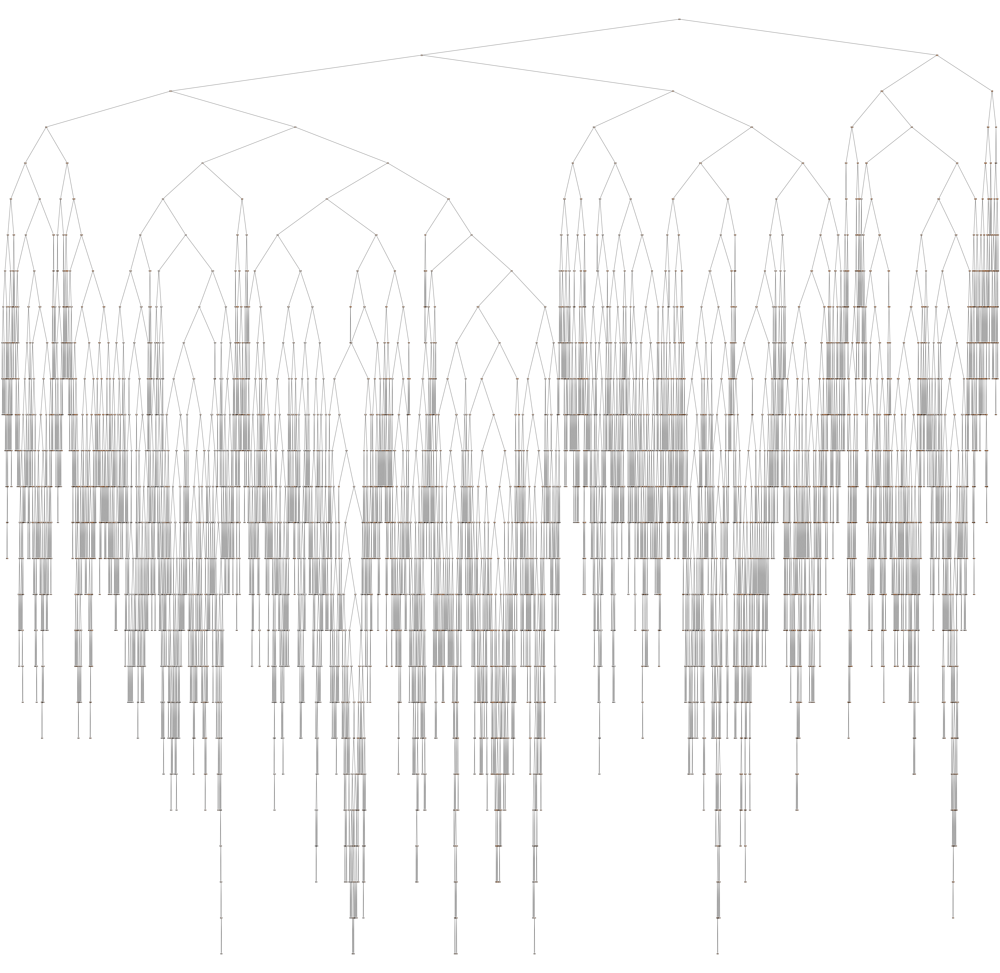

In [21]:
plt.figure(figsize=(100,100))
_ = tree.plot_tree(rf_model.estimators_[0], feature_names=X.columns, filled=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

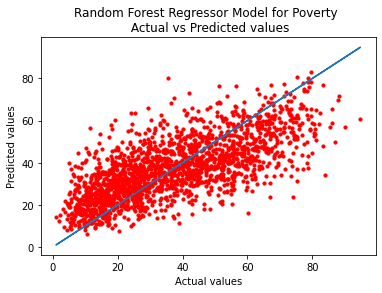

In [22]:
plt.figure()
plt.plot(y_test, y_test)
plt.scatter(y_test, y_pred, s=10, c="red")
plt.title("Random Forest Regressor Model for Poverty \n Actual vs Predicted values")
plt.xlabel("Actual values")
plt.ylabel("Predicted values")

plt.savefig("rfr_poverty_prediction_plot.png", format="png")
files.download('rfr_poverty_prediction_plot.png')

**Unemployment** Random Forest Regressor Model

Random forest predictive r-square: 0.300
Random forest predictive adjusted r-square: 0.298
Feature: 0, Score: 0.14205
Feature: 1, Score: 0.13396
Feature: 2, Score: 0.19874
Feature: 3, Score: 0.07030
Feature: 4, Score: 0.26433
Feature: 5, Score: 0.19062
Ozone           0.142053
PM2.5           0.133958
Diesel PM       0.198737
Pesticides      0.070302
Tox. Release    0.264332
Traffic         0.190618
dtype: float64


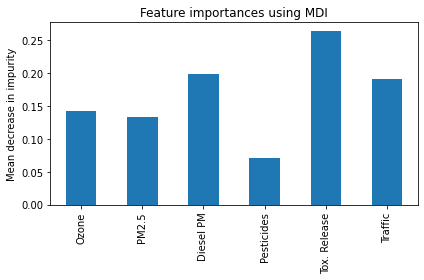

In [23]:
X = X_air_data
y = y_Unemployment

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

# Create a StandardScaler instance
# scaler = StandardScaler()
scaler = MinMaxScaler()
# scaler = RobustScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Create a random forest regressor.
rf_model = RandomForestRegressor(n_estimators=128, random_state=78)

# Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = rf_model.predict(X_test_scaled)
print(f"Random forest predictive r-square: {rf_model.score(X_test_scaled,y_test):.3f}")

# adjusted R-squared
adj_r2 = 1 - ( 1-rf_model.score(X_test_scaled, y_test) ) * ( len(y_test) - 1 ) / ( len(y_test) - X_test_scaled.shape[1] - 1 )
print(f"Random forest predictive adjusted r-square: {adj_r2:.3f}")

# get importance
importance = rf_model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
feature_names = list(X.columns.values)
forest_importances = pd.Series(importance, index=feature_names)
print(forest_importances)
fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

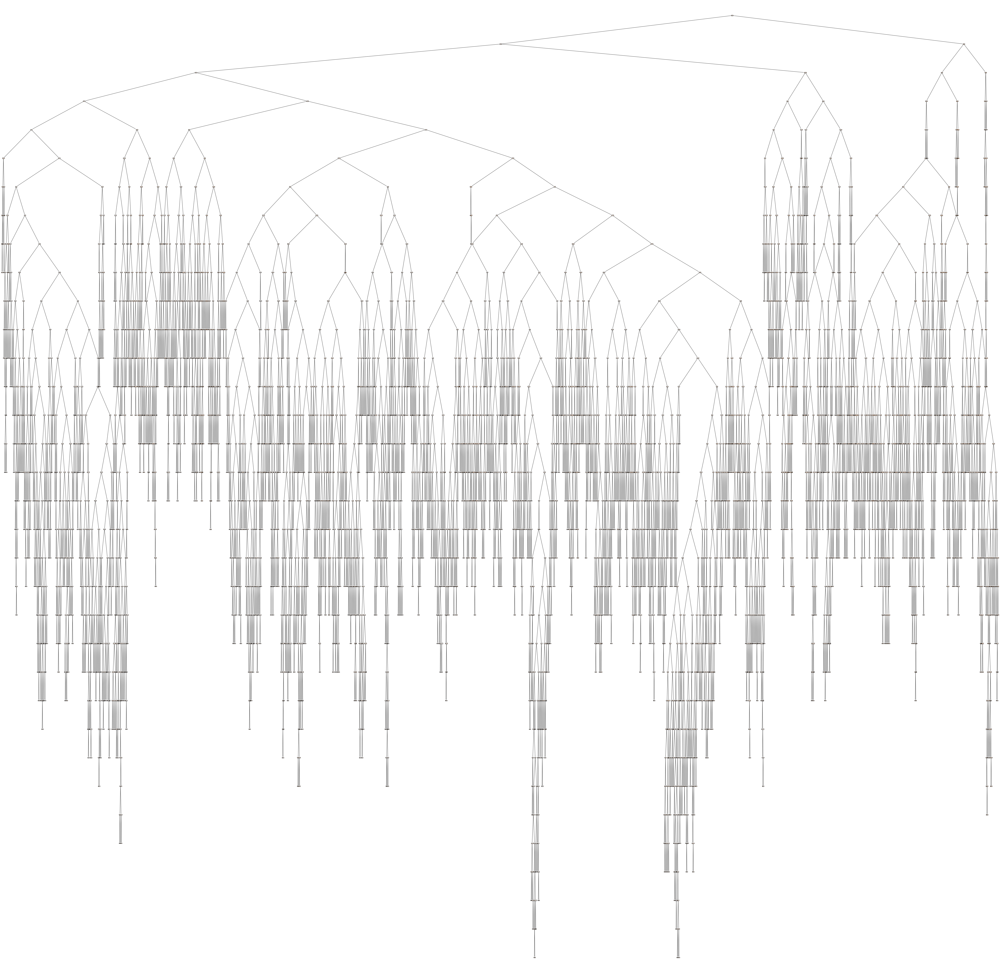

In [24]:
plt.figure(figsize=(100,100))
_ = tree.plot_tree(rf_model.estimators_[0], feature_names=X.columns, filled=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

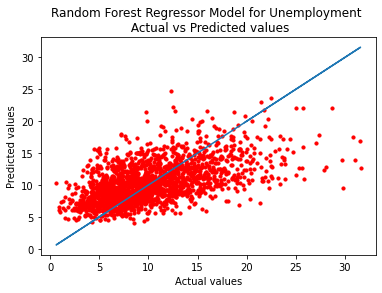

In [25]:
plt.figure()
plt.plot(y_test, y_test)
plt.scatter(y_test, y_pred, s=10, c="red")
plt.title("Random Forest Regressor Model for Unemployment \n Actual vs Predicted values")
plt.xlabel("Actual values")
plt.ylabel("Predicted values")

plt.savefig("rfr_ue_prediction_plot.png", format="png")
files.download('rfr_ue_prediction_plot.png')